# Project 

## Binary Classification of profitable or faltering companies


In order to give a prediction on a Company whether succeed or went in faltring. We train a data on ten companies during ten years with twenty measurable features. First we reduce the number of rows to the tenth by taking the mean of features values during tenyears.   Next we define the pytorch MLP model to train the given data. At the end we define a prediction function to realise the objective cited at the begining.

In [3]:
# pytorch mlp for binary classification
from numpy import vstack
from pandas import read_csv
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.utils.data import random_split
from torch import Tensor
from torch.nn import Linear
from torch.nn import ReLU
from torch.nn import Sigmoid
from torch.nn import Module
from torch.optim import SGD
from torch.nn import BCELoss
from torch.nn.init import kaiming_uniform_
from torch.nn.init import xavier_uniform_
import os
import torch
import pandas as pd
import numpy as np
from torch.utils.data import Dataset, random_split, DataLoader
from PIL import Image
import torchvision.models as models
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from sklearn.metrics import f1_score
import torch.nn.functional as F
import torch.nn as nn
from torchvision.utils import make_grid
%matplotlib inline

In [4]:
df = pd.read_excel('./companiesdata1/companies_data_all.xlsx')
df.shape 

(380, 23)

## Exploring the Data
 


In [5]:
df.Name

0       Company_1
1       Company_1
2       Company_1
3       Company_1
4       Company_1
          ...    
375    Company_38
376    Company_38
377    Company_38
378    Company_38
379    Company_38
Name: Name, Length: 380, dtype: object

In [6]:
df_original=df.copy()

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 380 entries, 0 to 379
Data columns (total 23 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Name    380 non-null    object 
 1   Year    380 non-null    int64  
 2   R1      380 non-null    float64
 3   R2      380 non-null    float64
 4   R3      380 non-null    float64
 5   R4      380 non-null    float64
 6   R5      380 non-null    object 
 7   R6      380 non-null    float64
 8   R7      380 non-null    object 
 9   R8      380 non-null    float64
 10  R9      380 non-null    float64
 11  R10     380 non-null    float64
 12  R11     380 non-null    float64
 13  R12     380 non-null    float64
 14  R13     380 non-null    object 
 15  R14     380 non-null    float64
 16  R15     380 non-null    float64
 17  R16     380 non-null    object 
 18  R17     380 non-null    float64
 19  R18     380 non-null    float64
 20  R19     380 non-null    float64
 21  R20     380 non-null    float64
 22  Cl

In [8]:
df.columns

Index(['Name', 'Year', 'R1', 'R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8', 'R9',
       'R10', 'R11', 'R12', 'R13', 'R14', 'R15', 'R16', 'R17', 'R18', 'R19',
       'R20', 'Class'],
      dtype='object')

In [9]:
df.describe()

,Year,R1,R2,R3,R4,R6,R8,R9,R10,R11,R12,R14,R15,R17,R18,R19,R20,Class
count,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000,380.000000
mean,2014.500000,52.776842,0.130237,0.102184,1.939605,2.571526,2.461237,17.279000,1.376868,-1.369789,2.781395,32.264842,67.735237,0.628158,2.707474,4.783000,2.738526,0.605263
std,2.876068,111.048049,0.437490,0.291330,2.022445,3.307338,25.619405,28.634339,54.221296,61.020884,9.111142,18.512429,18.512347,0.396137,3.747190,56.340919,2.342070,0.489439
min,2010.000000,0.000000,-1.080000,0.000000,0.000000,0.000000,0.000000,-396.240000,-937.300000,-937.300000,-43.800000,2.510000,0.180000,0.000000,0.000000,-218.250000,0.010000,0.000000
25%,2012.000000,2.272500,-0.030000,0.000000,1.060000,0.000000,0.547500,6.650000,-0.405000,-2.072500,-1.262500,17.660000,56.732500,0.420000,1.057500,0.785000,1.277500,0.000000
50%,2014.500000,11.655000,0.040000,0.000000,1.330000,0.000000,0.905000,14.680000,4.450000,2.730000,2.990000,30.200000,69.800000,0.580000,1.715000,1.620000,2.090000,1.000000
75%,2017.000000,43.797500,0.180000,0.100000,1.872500,5.322500,1.325000,28.852500,12.247500,9.327500,7.362500,43.267500,82.340000,0.790000,2.722500,2.870000,3.385000,1.000000
max,2019.000000,745.930000,3.600000,3.000000,12.180000,14.930000,500.130000,70.410000,123.270000,362.160000,38.400000,99.820000,97.490000,3.220000,27.050000,974.180000,20.140000,1.000000


In [ ]:
#pd.plotting.scatter_matrix(df[df.Company_Name == 'Company_2'], figsize=(20, 20), diagonal='kde');

In [10]:
df.corr()

,Year,R1,R2,R3,R4,R6,R8,R9,R10,R11,R12,R14,R15,R17,R18,R19,R20,Class
Year,1.000000e+00,0.089056,-0.090369,-0.074868,-0.020950,-0.089554,-0.044844,-0.117620,-0.082107,-0.106556,-0.152108,0.094454,-0.094457,-0.110838,0.024272,-0.017807,-0.048489,8.324031e-19
R1,8.905555e-02,1.000000,-0.129211,-0.110524,-0.172926,-0.061968,-0.028251,-0.363560,-0.115535,-0.165864,-0.171421,0.035992,-0.035993,-0.250339,-0.155121,-0.025052,-0.101776,-2.247187e-01
R2,-9.036917e-02,-0.129211,1.000000,0.794685,0.671458,0.343959,-0.070098,0.294934,0.232583,0.214675,0.704935,-0.257368,0.257369,0.122757,0.134800,-0.063402,0.206543,3.197105e-01
R3,-7.486817e-02,-0.110524,0.794685,1.000000,0.672862,0.393937,0.000873,0.226612,0.169013,0.143799,0.465475,-0.237505,0.237506,0.048168,0.114974,-0.017561,0.236144,2.440307e-01
R4,-2.095009e-02,-0.172926,0.671458,0.672862,1.000000,0.216615,-0.040468,0.240007,0.187068,0.161183,0.337075,-0.260360,0.260362,-0.023749,0.167986,-0.012735,0.220629,2.758327e-01
R6,-8.955376e-02,-0.061968,0.343959,0.393937,0.216615,1.000000,-0.035493,0.247349,0.217854,0.195894,0.502054,-0.449030,0.449031,0.108865,0.321528,-0.040082,0.410815,4.064518e-01
R8,-4.484419e-02,-0.028251,-0.070098,0.000873,-0.040468,-0.035493,1.000000,0.010327,-0.042705,-0.036633,-0.245591,0.192892,-0.192893,0.044825,0.003837,-0.007108,-0.046266,-5.286766e-02
R9,-1.176200e-01,-0.363560,0.294934,0.226612,0.240007,0.247349,0.010327,1.000000,0.313692,0.453335,0.390826,-0.257817,0.257819,0.086428,0.204933,-0.005496,0.241590,3.200548e-01
R10,-8.210732e-02,-0.115535,0.232583,0.169013,0.187068,0.217854,-0.042705,0.313692,1.000000,0.902743,0.331204,-0.230895,0.230894,0.129891,0.219290,-0.021500,0.208920,1.535112e-01
R11,-1.065559e-01,-0.165864,0.214675,0.143799,0.161183,0.195894,-0.036633,0.453335,0.902743,1.000000,0.324940,-0.202262,0.202272,0.127253,0.188058,-0.018482,0.173981,1.758138e-01


<AxesSubplot:>

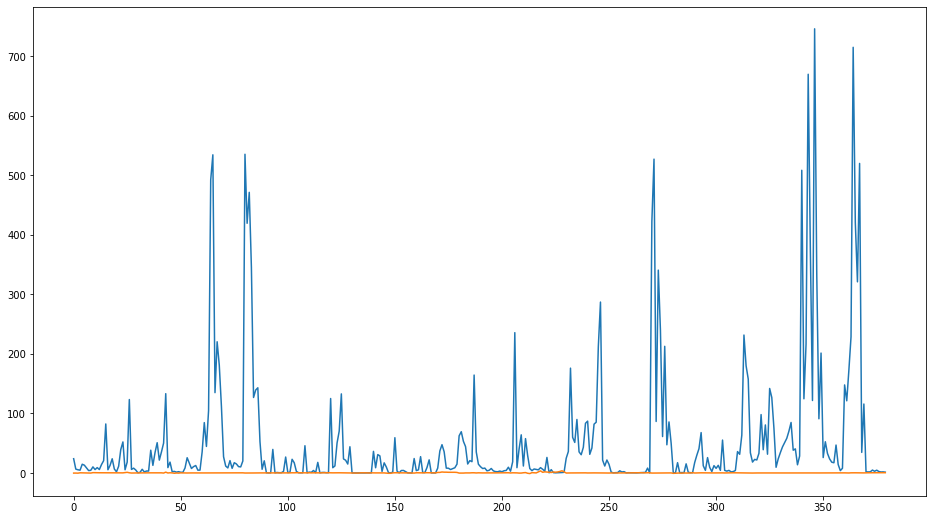

In [11]:
import seaborn as sns
fig, figsize=(16,9)
df.R1.plot(figsize=(16,9))
df.R2.plot(figsize=(16,9))

In [12]:
Companies=df['Name'].unique()
Companies

array(['Company_1', 'Company_2', 'Company_3', 'Company_4', 'Company_5',
       'Company_6', 'Company_7', 'Company_8', 'Company_9', 'Company_10',
       'Company_11', 'Company_12', 'Company_13', 'Company_14',
       'Company_15', 'Company_16', 'Company_17', 'Company_18',
       'Company_19', 'Company_20', 'Company_21', 'Company_22',
       'Company_23', 'Company_24', 'Company_25', 'Company_26',
       'Company_27', 'Company_28', 'Company_29', 'Company_30',
       'Company_31', 'Company_32', 'Company_33', 'Company_34',
       'Company_35', 'Company_36', 'Company_37', 'Company_38'],
      dtype=object)

In [13]:
dfs=df.groupby(['Name','Year'])

In [14]:
dfs.first()

R1    R2    R3    R4     R5    R6     R7    R8     R9  \
Name      Year                                                              
Company_1 2010   10.13  0.46  0.00  2.97    8.3  0.00      0  1.28  46.25   
          2011    4.42 -0.25  0.00  2.31  -9.35  0.00      0  1.02  41.87   
          2012    3.92 -0.14  0.00  1.82  -8.74  0.00      0  0.69  40.27   
          2013    8.40  0.19  0.10  2.05   9.61  5.35   51.4  0.91  51.68   
          2014   12.98  0.24  0.13  2.08  13.32  3.88  51.69  1.54  51.20   
...                ...   ...   ...   ...    ...   ...    ...   ...    ...   
Company_9 2015  126.72 -0.09  0.00  1.07  -3.64  0.00      0  0.30  -4.05   
          2016  345.17 -0.05  0.00  1.02  -5.07  0.00      0  0.26  10.54   
          2017  471.23 -0.25  0.00  0.76  -2.99  0.00      0  0.98   3.00   
          2018  419.26 -0.18  0.00  0.58   -4.5  0.00      0  1.39  -6.80   
          2019  535.21 -0.16  0.00  0.42  -2.81  0.00      0  1.10 -10.88   

                  R10  ...    R12    R13    R14    R15   R16   R17   R18  \
Name      Year         ...                                                 
Company_1 2010  23.67  ...  10.47  15.43  40.34  59.66  8.07  0.46  3.60   
          2011  -9.98  ...  -4.59 -10.88  40.81  59.19 -2.37  0.45  3.40   
          2012  -4.16  ...  -2.14  -7.85  43.68  56.32 -1.02  0.49  1.96   
          2013  13.64  ...   6.37   9.49  45.92  54.08  3.67  0.49  1.60   
          2014  12.88  ...   6.00   11.6  44.64  55.36  3.41  0.69  2.22   
...               ...  ...    ...    ...    ...    ...   ...   ...   ...   
Company_9 2015 -21.51  ...  -5.69  -8.23  30.79  69.21 -2.76  0.19  0.30   
          2016  -8.39  ...  -3.22  -5.05  36.17  63.83 -1.14  0.20  0.33   
          2017 -52.10  ... -16.11 -32.88  51.00  49.00 -6.61  0.27  0.47   
          2018 -22.42  ... -13.80 -30.86  55.28  44.72 -3.51  0.48  0.75   
          2019 -27.38  ... -14.86 -39.02  61.92  38.08 -3.28  0.42  0.58   

                 R19   R20  Class  
Name      Year                     
Company_1 2010  1.03  2.44      1  
          2011  1.25  2.01      1  
          2012  2.53  1.53      1  
          2013  2.03  1.64      1  
          2014  2.76  1.67      1  
...              ...   ...    ...  
Company_9 2015  3.90  1.16      0  
          2016  8.15  1.07      0  
          2017 -3.21  0.84      0  
          2018 -2.44  0.64      0  
          2019 -1.24  0.46      0  

[380 rows x 21 columns]

<AxesSubplot:>

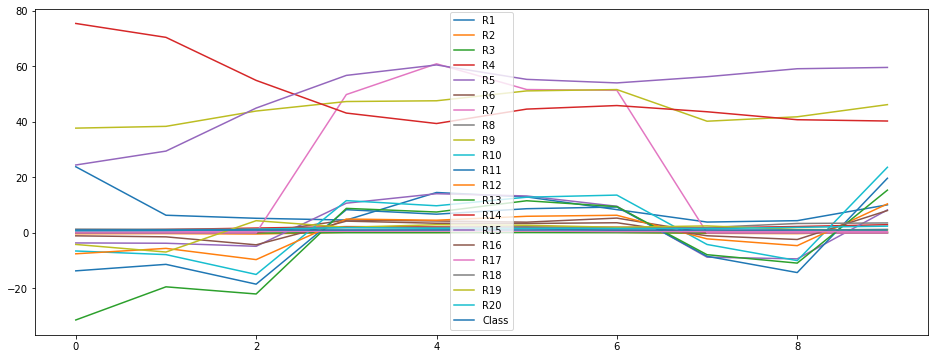

In [15]:
df.drop(columns='Year').loc[df.Name =='Company_1'].plot(figsize=(16,6))

In [16]:
df['Year'] = pd.to_datetime(df['Year'], format='%Y')

In [19]:
df.tail()

,Name,Year,R1,R2,R3,R4,R5,R6,R7,R8,...,R12,R13,R14,R15,R16,R17,R18,R19,R20,Class
375,Company_38,2014-01-01,4.61,0.27,0.25,4.74,14.67,6.25,91.68,0.84,...,5.90,5.75,4.81,95.19,0,0.11,17.38,0.60,5.77,1
376,Company_38,2013-01-01,2.34,0.26,0.22,4.57,17.45,4.85,84.56,0.99,...,6.04,5.69,4.52,95.48,0,0.12,16.32,0.70,6.31,1
377,Company_38,2012-01-01,1.56,0.31,0.25,4.42,14.95,5.33,79.71,1.06,...,7.55,7.1,4.28,95.72,103.63,0.12,12.61,0.69,6.87,1
378,Company_38,2011-01-01,1.75,0.33,0.25,4.52,14.98,5.05,75.68,1.10,...,8.12,7.31,3.38,96.62,359.9,0.16,15.46,0.81,9.94,1
379,Company_38,2010-01-01,1.24,0.38,0.28,4.91,12.21,5.97,72.89,0.95,...,8.22,7.82,2.51,97.49,"1,178,25",0.13,10.51,0.96,9.26,1


## Filling missing values in the column R5

In [20]:
[[k,df.Name[k],type(df.R5[k]),df.R5[k]] for k in range(len(df.R5)) if type(df.R5[k])==str]

[[185, 'Company_19', str, '4,948,17'],
 [190, 'Company_20', str, '1,149,67'],
 [191, 'Company_20', str, '-1,316,17'],
 [237, 'Company_24', str, '1,611,89'],
 [361, 'Company_37', str, '-1,465,27']]

In [21]:
df.R5[185]=df.loc[df.Name == 'Company_19'].R5.drop(185).mean()
df.R5[190]=df.loc[df.Name == 'Company_20'].R5.drop([190,191]).mean()
df.R5[191]=df.loc[df.Name == 'Company_20'].R5.drop(191).mean()
df.R5[237]=df.loc[df.Name == 'Company_24'].R5.drop(237).mean()
df.R5[361]=df.loc[df.Name == 'Company_37'].R5.drop(361).mean()


/Users/bensayahabdallah/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/Users/bensayahabdallah/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/bensayahabdallah/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-

## Filling missing values in the column R7

In [22]:
[[k,df.Name[k],type(df.R7[k]),df.R7[k]] for k in range(len(df.R7)) if type(df.R7[k])==str]



[[237, 'Company_24', str, '6,716,21']]

In [23]:
df.R7[237] = df.loc[df.Name == 'Company_24'].R7.drop(237).mean()


/Users/bensayahabdallah/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


## Filling missing values in the column R13

In [24]:
[[k,df.Name[k],type(df.R13[k]),df.R13[k]] for k in range(len(df.R13)) if type(df.R13[k])==str]

[[147, 'Company_15', str, '-34,544,15']]

In [25]:
df.R13[147] = df.loc[df.Name == 'Company_15'].R13.drop(147).mean()



/Users/bensayahabdallah/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


## Filling missing values in the column R16

In [26]:
[[k,df.Name[k],type(df.R16[k]),df.R16[k]] for k in range(len(df.R16)) if type(df.R16[k])==str]

[[104, 'Company_11', str, '1,009,89'],
 [136, 'Company_14', str, '24,558,70'],
 [150, 'Company_16', str, '1,282,54'],
 [151, 'Company_16', str, '1,047,65'],
 [153, 'Company_16', str, '6,450,90'],
 [284, 'Company_29', str, '-1,084,80'],
 [379, 'Company_38', str, '1,178,25']]

In [27]:
df.R16[104] = df.loc[df.Name == 'Company_11'].R16.drop(104).mean()
df.R16[136] = df.loc[df.Name =='Company_14'].R16.drop(136).mean()
df.R16[150] = df.loc[df.Name =='Company_16'].R16.drop([150,151,153]).mean()
df.R16[151] = df.loc[df.Name =='Company_16'].R16.drop([150,151,153]).mean()
df.R16[153] = df.loc[df.Name =='Company_16'].R16.drop([150,151,153]).mean()
df.R16[284] = df.loc[df.Name =='Company_29'].R16.drop(284).mean()
df.R16[379] = df.loc[df.Name =='Company_38'].R16.drop(379).mean()

/Users/bensayahabdallah/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/Users/bensayahabdallah/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/bensayahabdallah/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-

In [28]:
df.R5.astype(np.float64),
df.R7.astype(np.float64),
df.R13.astype(np.float64),
df.R16.astype(np.float64);
df = df.convert_dtypes()

In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 380 entries, 0 to 379
Data columns (total 23 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Name    380 non-null    string        
 1   Year    380 non-null    datetime64[ns]
 2   R1      380 non-null    float64       
 3   R2      380 non-null    float64       
 4   R3      380 non-null    float64       
 5   R4      380 non-null    float64       
 6   R5      380 non-null    float64       
 7   R6      380 non-null    float64       
 8   R7      380 non-null    float64       
 9   R8      380 non-null    float64       
 10  R9      380 non-null    float64       
 11  R10     380 non-null    float64       
 12  R11     380 non-null    float64       
 13  R12     380 non-null    float64       
 14  R13     380 non-null    float64       
 15  R14     380 non-null    float64       
 16  R15     380 non-null    float64       
 17  R16     380 non-null    float64       
 18  R17     38

## Transformation of data to mean values of features over ten years

In [13]:
df.Name

0       Company_1
1       Company_1
2       Company_1
3       Company_1
4       Company_1
          ...    
375    Company_38
376    Company_38
377    Company_38
378    Company_38
379    Company_38
Name: Name, Length: 380, dtype: string

In [30]:
companies=df.Name.unique()

In [31]:
df_mean=pd.DataFrame(columns=df.drop(columns=['Name','Year']).columns)
df_mean

,R1,R2,R3,R4,R5,R6,R7,R8,R9,R10,...,R12,R13,R14,R15,R16,R17,R18,R19,R20,Class


In [32]:
for k in range(len(companies)):
    df_mean.loc[k]=list(df[df.Name == companies[k]].drop(columns=['Name','Year']).mean().values)

df_mean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38 entries, 0 to 37
Data columns (total 21 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   R1      38 non-null     float64
 1   R2      38 non-null     float64
 2   R3      38 non-null     float64
 3   R4      38 non-null     float64
 4   R5      38 non-null     float64
 5   R6      38 non-null     float64
 6   R7      38 non-null     float64
 7   R8      38 non-null     float64
 8   R9      38 non-null     float64
 9   R10     38 non-null     float64
 10  R11     38 non-null     float64
 11  R12     38 non-null     float64
 12  R13     38 non-null     float64
 13  R14     38 non-null     float64
 14  R15     38 non-null     float64
 15  R16     38 non-null     float64
 16  R17     38 non-null     float64
 17  R18     38 non-null     float64
 18  R19     38 non-null     float64
 19  R20     38 non-null     float64
 20  Class   38 non-null     float64
dtypes: float64(21)
memory usage: 6.5 KB


In [33]:
# demonstrate data normalization with sklearn
from sklearn.preprocessing import MinMaxScaler
# load data
#data = df.drop(columns='Company_Name')
# create scaler
scaler = MinMaxScaler(feature_range=(-1,1))
#scaler = MinMaxScaler()

# fit scaler on data
scaler.fit(df_mean)
# apply transform
data_mean = scaler.transform(df_mean)
data_mean =pd.DataFrame(data_mean,columns=df_mean.columns)
data_mean

,R1,R2,R3,R4,R5,R6,R7,R8,R9,R10,...,R12,R13,R14,R15,R16,R17,R18,R19,R20,Class
0,-0.944552,-0.792008,-0.942088,-0.721877,-0.245074,-0.483679,-0.680286,-0.969131,0.627647,0.198650,...,-0.395092,0.318155,0.290054,-0.290054,-0.589190,-0.268062,-0.780349,-0.644644,-0.666310,1.0
1,-0.890970,-0.558402,-0.886869,-0.772408,-0.196927,0.305422,-0.437070,-0.968240,1.000000,0.456668,...,0.237435,0.583425,-0.735358,0.735358,-0.118592,-0.257259,-0.851770,-0.638242,0.131075,1.0
2,-0.841102,-0.594262,-0.979798,-0.855023,-0.216622,-0.727505,-0.835002,-0.947131,0.606269,0.258274,...,0.070472,0.532352,-0.355632,0.355632,-0.551664,-0.096556,-0.706709,-0.631030,-0.350921,1.0
3,-0.911198,-0.737705,-0.993266,-0.883297,1.000000,-0.947488,-0.896796,-0.951779,0.008565,0.197733,...,-0.254564,0.451507,-0.081146,0.081146,-0.371520,0.265361,-0.761543,-0.600212,-0.555080,1.0
4,-0.838026,-0.751025,-0.973064,-0.737317,-0.207826,-0.689469,-0.930062,-0.978271,-0.076595,0.169677,...,-0.234471,0.376780,0.212190,-0.212190,-0.577622,-0.615125,-0.758162,-0.671260,-1.000000,-1.0
5,-0.945916,-0.788934,-0.989226,-0.900341,0.008054,-0.701675,-0.737298,-0.982609,0.162126,0.183214,...,-0.363561,0.368021,-0.341103,0.341103,-0.588899,-0.334234,-0.922029,-0.655876,-0.422222,-1.0
6,0.147157,-0.785861,-0.995960,-0.902346,-0.273846,-0.695998,-0.831072,-1.000000,0.272238,0.038637,...,-0.395092,0.377634,-0.728683,0.728683,-0.557579,-0.666442,-0.937031,-0.643949,0.104932,-1.0
7,-0.912793,-0.614754,-0.870707,-0.808502,-0.182354,0.539597,-0.134886,-0.964057,0.320087,0.372790,...,0.124585,0.555538,-0.341524,0.341524,-0.487560,-0.110061,-0.671421,-0.634685,-0.284848,1.0
8,0.333339,-0.858607,-0.989226,-0.918989,-0.285934,-0.467499,-0.233113,-0.985979,-0.017501,0.022165,...,-0.688063,0.197234,-0.042662,0.042662,-0.611619,-0.538150,-0.941469,-0.618028,-0.777540,-1.0
9,-0.958528,-0.775615,-1.000000,-0.951273,0.059867,-1.000000,-1.000000,-0.977962,-0.100030,0.169769,...,-0.398826,0.401335,1.000000,-1.000000,-0.573327,-0.232951,-0.923613,-0.482896,-0.781581,-1.0


### Pandas Profiling

In [18]:
#! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

In [34]:
import seaborn as sns
import pandas_profiling as pp
from pandas_profiling import ProfileReport

In [20]:
pp.ProfileReport(df_mean)

Summarize dataset:   0%|          | 0/34 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [35]:
# Threshold for removing correlated variables
threshold = 0.9

def highlight(value):
    if value > threshold:
        style = 'background-color: pink'
    else:
        style = 'background-color: palegreen'
    return style

# Absolute value correlation matrix
corr_matrix = df_mean.corr().abs().round(2)
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
upper.style.format("{:.2f}").applymap(highlight)

,R1,R2,R3,R4,R5,R6,R7,R8,R9,R10,R11,R12,R13,R14,R15,R16,R17,R18,R19,R20,Class
R1,nan,0.23,0.18,0.23,0.17,0.15,0.17,0.10,0.58,0.38,0.57,0.32,0.12,0.02,0.02,0.27,0.41,0.22,0.14,0.13,0.30
R2,nan,nan,0.95,0.82,0.03,0.49,0.29,0.05,0.41,0.45,0.47,0.74,0.52,0.25,0.25,0.30,0.06,0.15,0.12,0.29,0.41
R3,nan,nan,nan,0.75,0.03,0.48,0.36,0.00,0.33,0.41,0.41,0.59,0.35,0.25,0.25,0.27,0.00,0.14,0.05,0.32,0.28
R4,nan,nan,nan,nan,0.01,0.31,0.21,0.08,0.32,0.40,0.40,0.41,0.21,0.27,0.27,0.29,0.06,0.18,0.02,0.26,0.28
R5,nan,nan,nan,nan,nan,0.11,0.09,0.41,0.01,0.09,0.14,0.00,0.06,0.05,0.05,0.07,0.28,0.06,0.03,0.03,0.17
R6,nan,nan,nan,nan,nan,nan,0.76,0.16,0.43,0.61,0.64,0.68,0.46,0.64,0.64,0.37,0.05,0.51,0.16,0.64,0.65
R7,nan,nan,nan,nan,nan,nan,nan,0.17,0.21,0.41,0.43,0.31,0.12,0.60,0.60,0.17,0.06,0.34,0.04,0.60,0.42
R8,nan,nan,nan,nan,nan,nan,nan,nan,0.11,0.02,0.02,0.15,0.10,0.31,0.31,0.06,0.17,0.05,0.00,0.11,0.17
R9,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.61,0.73,0.55,0.27,0.29,0.29,0.26,0.05,0.29,0.07,0.34,0.47
R10,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.92,0.55,0.40,0.47,0.47,0.36,0.15,0.46,0.22,0.47,0.37


## Binary Classification using Pytorch MLP (Multilayer Perceptron)

## Creating Datasets 

In [42]:
# dataset definition
class CSVDataset(Dataset):
    # load the dataset
    def __init__(self, df):
        # load the csv file as a dataframe
        #df = read_csv(path,index_col=0) #header = None
        # store the inputs and outputs
        self.X = df.values[:, :-1]
        self.y = df.values[:, -1]
        # ensure input data is floats
        self.X = self.X.astype('float32')
        # label encode target and ensure the values are floats
        self.y = LabelEncoder().fit_transform(self.y)
        self.y = self.y.astype('float32')
        self.y = self.y.reshape((len(self.y), 1))
        # number of rows in the dataset
    def __len__(self):
        return len(self.X)
    # get a row at an index
    def __getitem__(self, idx):
        return [self.X[idx], self.y[idx]]
    # get indexes for train and test rows
    def get_splits(self, n_test=0.33):
        # determine sizes
        test_size = round(n_test * len(self.X))
        train_size = len(self.X) - test_size
        # calculate the split
        return random_split(self, [train_size, test_size])

## Model

In [43]:
# model definition
class MLP(Module):
    # define model elements
    def __init__(self, n_inputs):
        super(MLP, self).__init__()
        # input to first hidden layer
        self.hidden1 = Linear(n_inputs, 10)
        kaiming_uniform_(self.hidden1.weight, nonlinearity='relu')
        self.act1 = ReLU()
        # second hidden layer
        self.hidden2 = Linear(10, 8)
        kaiming_uniform_(self.hidden2.weight, nonlinearity='relu')
        self.act2 = ReLU()
        # third hidden layer and output
        self.hidden3 = Linear(8, 1)
        xavier_uniform_(self.hidden3.weight)
        self.act3 = Sigmoid()
        # forward propagate input
    def forward(self, X):
        # input to first hidden layer
        X = self.hidden1(X)
        X = self.act1(X)
         # second hidden layer
        X = self.hidden2(X)
        X = self.act2(X)
        # third hidden layer and output
        X = self.hidden3(X)
        X = self.act3(X)
        return X

## Data Loaders

In [44]:
# prepare the dataset
def prepare_data(path):
    # load the dataset
    dataset = CSVDataset(path)
    # calculate split
    train, test = dataset.get_splits()
    # prepare data loaders
    train_dl = DataLoader(train, batch_size=32, shuffle=True)
    test_dl = DataLoader(test, batch_size=1024, shuffle=False)
    return train_dl, test_dl



In [45]:
# train the model
def train_model(train_dl, model):
    # define the optimization
    criterion = BCELoss()
    optimizer = SGD(model.parameters(), lr=0.01, momentum=0.9)
    # enumerate epochs
    for epoch in range(100):
        # enumerate mini batches
        for i, (inputs, targets) in enumerate(train_dl):
            # clear the gradients
            optimizer.zero_grad()
            # compute the model output
            yhat = model(inputs)
            # calculate loss
            loss = criterion(yhat, targets)
            # credit assignment
            loss.backward()
            # update model weights
            optimizer.step()

In [46]:
# evaluate the model
def evaluate_model(test_dl, model):
    predictions, actuals = list(), list()
    for i, (inputs, targets) in enumerate(test_dl):
        # evaluate the model on the test set
        yhat = model(inputs)
        # retrieve numpy array
        yhat = yhat.detach().numpy()
        actual = targets.numpy()
        actual = actual.reshape((len(actual), 1))
        # round to class values
        yhat = yhat.round()
        # store
        predictions.append(yhat)
        actuals.append(actual)
    predictions, actuals = vstack(predictions), vstack(actuals)
    # calculate accuracy
    acc = accuracy_score(actuals, predictions)
    return acc

In [47]:
# make a class prediction for one row of data
def predict(row, model):
    # convert row to data
    row = Tensor([row])
    # make prediction
    yhat = model(row)
    # retrieve numpy array
    yhat = yhat.detach().numpy()
    return yhat

In [48]:
# prepare the data
#path = 'data_gh/cleaned_mean_data_simplified.csv'
train_dl, test_dl = prepare_data(data_mean)
print(len(train_dl.dataset), len(test_dl.dataset))

25 13


In [49]:
# define the network
model = MLP(20)

### Training & Validation sets

In [50]:
# train the model
train_model(train_dl, model)

In [51]:
# evaluate the model
acc = evaluate_model(test_dl, model)
print('Accuracy: %.3f' % acc)

Accuracy: 0.769


In [52]:
torch.save(model.state_dict(), 'best-model-parameters.pt') 

## Making predictions

In [53]:
# make a single prediction (expect class=1)
row = [0.60536,-0.38223,0.84356,-0.38542,0.58212,-0.32192,0.56971,-0.29674,0.36946,-0.47357,0.60536,-0.38223,0.84356,-0.38542,0.58212,-0.32192,0.56971,-0.29674,0.36946,-0.47357]
yhat = predict(row, model)
print('Predicted: %.3f (class=%d)' % (yhat, yhat.round()))

Predicted: 0.446 (class=0)


In [54]:
# make a single prediction (expect class=1)
a=[ 1,  2,  3,  5 , 6,  7,  8,  9, 10,  9,1,  2,  3,  5 , 6,  7,  8,  9, 10,  9]
yhat = predict(a, model)
print('Predicted: %.3f (class=%d)' % (yhat, yhat.round()))

Predicted: 0.987 (class=1)


## Some References
 - https://www.kaggle.com/vbmokin/heart-disease-automatic-adveda-fe-20-models
 - https://www.kaggle.com/kanncaa1/pytorch-tutorial-for-deep-learning-lovers